# Machine-Learning implementation for Strain-Design

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [2]:
import pandas as pd
import numpy as np
import cobra as cb
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from pprint import pprint
from cobra.flux_analysis import production_envelope

import pickle
import random
import time
import os
import sys
import subprocess
import math

from functools import partial

from scipy.stats import qmc

from pyswarms.discrete import BinaryPSO

from sklearn import preprocessing
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

import autosklearn.regression

#allow relative imports
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from utils.designFunctions import * 
from utils.DesignScores import *
from utils.PSO4SD import *

## IDEA

<font size="5">  
    This notebook explore the idea of <i>de novo</i> strategies generation using a ML approach 
</font> 

![ML4SD workflow](figures/ML4SD_paper.png)

In this workflow, a **DBTL cycle is implemented to improve ML models that predict strain designs capable of coupling production to growth**, using as the initial training set deletion strategies obtained by gcSwarms. This algorithm generates a variable number of coupled strategies within a given time frame. If the generated set is not representative enough to correctly train the model, it will be expanded in each cycle to improve the model at the **optimization and learning level**. In this workflow, designs are defined as binary vectors of a length equal to the number of different reactions (*t*) in the initial dataset (*Known space*), with a maximum number of deletions set by the user (*d*).<br>

**LEARN**<br>
<br>
Following the methodology described in [*A machine learning Automated Recommendation Tool for synthetic biology*](https://www.nature.com/articles/s41467-020-18008-4) **[1]**, we will train different ML models based on the initial dataset. In this application, the ***AutoSklearn*** package ([documentation](https://automl.github.io/auto-sklearn/master/index.html#)) is used, which trains and optimizes multiple ML models in parallel, ultimately combining them into an ***Ensemble Model*** that fits the data as well as possible ([article](https://papers.neurips.cc/paper/5872-efficient-and-robust-automated-machine-learning)).

**DESIGN**<br>
<br>
In each cycle, using the predictions generated by the model, **the individual contribution of each reaction to the predicted performance and the error it generates in the model is quantified**. From these values, **a sampling distribution is generated**, following the approach used in [*Simulated Design−Build−Test−Learn Cycles for Consistent Comparison of Machine Learning Methods in Metabolic Engineering*](https://pubs.acs.org/doi/10.1021/acssynbio.3c00186) **[2]**. However, as our design space consists of an unmanageable number of combinations ($> 10^{25}$), we opted to generate a representation of it using Latin Hypercube Sampling, ensuring optimal representativity of the variability in the generated designs. Once this population is generated, the possible sampling distributions are calculated:
- **Exploitative**: calculated based on the individual contribution of each reaction to the final design score.
- **Explorative**: calculated based on the individual contribution of each reaction to the absolute prediction error in the model.

These **distributions can be used individually or combined**, depending on the importance assigned by the user to optimizing performance or better learning the design space.

**BUILD**<br>
<br>
From the final sampling distribution, **recommendations for strategies are generated** to evaluate and expand the design space used to train the model. Between different cycles, the strategy is to add a new number of strategies equal to the number of strategies used to train the model previously, as according to **[2]**, this is the scenario where fewer cycles are needed to generate a model that effectively learns the design space.

**TEST**<br>
<br>
Finally, all **designs generated in the BUILD step are evaluated in the GEM** of the chosen chassis. This constitutes the new training set used to train the ML model in the next cycle, incorporating new useful information.

<!---En este workflow se implementa un **ciclo DBTL para la mejora de modelos de ML que predigan diseños de cepa capaces de acoplar la producción al crecimiento**, usando como conjunto de entrenamiento inicial estrategias de delección obtenidas por gcSwarms. Este algoritmo genera un número variable de estrategias acopladas en un intervalo de tiempo dado. En el caso de que el conjunto generado no sea lo suficiente representativo como para entrenar correctamente el modelo, se irá expandiendo en cada ciclo con el fin de mejorar el modelo a **nivel de optimización y aprendizaje**. En este workflow, los diseños se definen como vectores binarios de una longitud igual al número de reacciones diferentes (*t*) en el dataset inicial (*Known space*) y que tienen un máximo de delecciones fijadas por el usuario (*d*).<br>

**LEARN**<br>
<br>
Siguiendo la metodología descrita en [*A machine learning Automated Recommendation Tool for synthetic biology*](https://www.nature.com/articles/s41467-020-18008-4) **[1]**, entrenaremos diferentes modelos de ML a partir del dataset incial. En esta aplicación se opta por usar el paquete ***AutoSklearn*** ([documentación](https://automl.github.io/auto-sklearn/master/index.html#)), que entrena y optimiza de forma paralela diferentes modelos de ML, los cuales finalmente combina para formar un ***Ensemble Model*** que se ajusta lo mejor posible a los datos ([artículo](https://papers.neurips.cc/paper/5872-efficient-and-robust-automated-machine-learning)).

**DESIGN**<br>
<br>
En cada ciclo, con las predicciones generadas por el modelo, **se cuantifica la aportación individual de cada reacción al rendimiento predicho y al error** que genera en el modelo. A partir de estos valores, **se genera una distribución de muestreo**, siguiendo el planteamiento utilizado en  [*Simulated Design−Build−Test−Learn Cycles for Consistent Comparison of Machine Learning Methods in Metabolic Engineering*](https://pubs.acs.org/doi/10.1021/acssynbio.3c00186) **[2]**. Sin embargo, al constituir nuestro espacio de diseño de un número de combinaciones no abordable ($> 10^{25}$), se ha optado por generar una representación del mismo mediante Latin Hypercube Sampling, que garantiza una representatividad óptima de la variabilidad en los diseños generados. Una vez generada esta población, se calculan las posibles distribuciones de muestreo:
- **Exploitative**: se calcula a partir de la contribución individual de cada reacción a la puntuación final del diseño.
- **Explorative**: se calcula a partir de la contribución individual de cada reacción al error absoluto en la predicción del modelo.

Estas **distribuciones se pueden usar de forma individual o combinada**, según la importacia que le asigne el usuario a optimizar el rendimiento o a aprender mejor el espacio de diseño

**BUILD**<br>
<br>
A partir del la distribución de muestreo final, **se generaran recomendaciones de estrategias** a evaluar para expandir el espacio de diseño con el que entrenar al modelo. Entre diferentes ciclos, se sigue la estrategia de añadir un número nuevo de estrategias igual al número de estrategias con las que se ha entrenado el modelo previamente, ya que según **[2]** es el escenario en el que menos ciclos se necesitan para generar un modelo que aprenda bien el espacio de diseño.

**TEST**<br>
<br>
Finalmente, todos los **diseños generados en el paso BUILD se evalúan en el GEM** del chasis escogido. De esta forma, se constituye el nuevo set de entrenamiento con el que se entrenará el modelo de ML en el siguiente ciclo, que incluye nueva información útil.--->

In [3]:
start = time.time()

#### PUT HERE THE CYCLE NUMBER OF THE DBTL YOU ARE IN

In [4]:
C=4

#### PUT HERE THE DBTL REQUIRED PARAMETERS

In [5]:
#Strain-Design parameters
max_kos=30
target_var='bcpy'
add_other_score=None
init_library_size = 1200 #Higher numbers favours GC designs founded and early learning but also can lead to local optimal biased search
execution_mode = "precomputed_targets" #either precomputed_targets or de_novo_strain_design

#Machine-Learning parameters
#Time limit was setted by dataset size, as we are using one part in a ten of the data in comparision with the paper we will use a tenth part of the time for training (40 min)
training_time = 4*60 #Determined using the data in training_time.csv
recommendation_mode = "exploitative"    
validated_recommendations = True #Wether or not recommendations of previous cycle have been tested.

#Sampling Distribution parameters
exploring_importance = 0
optimizing_importance = 1-exploring_importance
optimization_threshold = 0.5 # Threshold to consider a design as a good performer. Relative to the maximum score in library or or


if recommendation_mode == "explorative":
    n_recommendations = init_library_size*C #This way, in each cycle are added a number of strategies equal to the previously trained overall cycles
    
if recommendation_mode == "exploitative":
    n_recommendations = int(input("You have selected explotative mode, please indicate the exploitation designs to recommend: "))

You have selected explotative mode, please indicate the exploitation designs to recommend: 100


#### SPECIFY THE PATHS OF THE PROJECT INPUT DATA

In [6]:
carbon_source = 'EX_4hbz_e'
target_reaction = 'EX_6ax_c'
dir_name = 'examples/PSO4SD'

bioprocess = '_'.join([carbon_source, target_reaction])
project = '_'.join([bioprocess, 'chemical_space_ko_results'])
targets_filename = '_'.join([bioprocess, 'chemical_space_reaction_analysis.pkl']) #If execution mode is precomputed_targets
GEM_path = '/'.join([dir_name, project,  'configured_model.mat'])

## Computation of Bioprocess Metabolic Features

In [7]:
%%time
model = cb.io.load_matlab_model(GEM_path)
model_bounds = {r.id : r.bounds for r in model.reactions}
target_biomass = [r.id for r in model.reactions if r.id in str(model.objective.expression) ][0]

prod_env = production_envelope(model, 
                               [target_biomass], 
                               objective=target_reaction, 
                               carbon_sources=carbon_source)

model_setup = {'model' : model,
               'model_bounds' : model_bounds,
               'carbon_source' : carbon_source,
               'target_reaction' : target_reaction,
               'target_biomass' : target_biomass,
               'max_target_flux' : prod_env['flux_maximum'].max(),
               'max_target_biomass_flux' : prod_env[target_biomass].max()}

if execution_mode == "de_novo_strain_design":    
    #Generate Essential Reaction list to exclude them for the search
    print("Computing essential reactions..")
    model_setup["essential_rxns"] = select_protected_reactions_in_parallel(model, target_biomass, target_reaction)
    model_setup["targets_output"] = '/'.join([dir_name, project, targets_filename])
    
    #Execute an external script to compute targets
    pickle.dump(model_setup, open('search_candidates_config.pkl', 'wb'))
    print(subprocess.run(['python utils/search_reaction_candidates.py'], shell=True))
    targets = pickle.load(open(model_setup["targets_output"], 'rb'))

if execution_mode == "precomputed_targets":
    test_filepath = '/'.join([dir_name, project, targets_filename])
    targets = pickle.load(open(test_filepath, 'rb')) #pd.read_csv(test_filepath)['Reaction'].tolist()
    
reaction_list = targets
model_setup['reaction_list'] = targets

print('Workflow detect %u  Knock-Out targets' % len(targets))
print('Maximum flux through target reaction: ', model_setup['max_target_flux'])

model.summary()

Set parameter Username


2024-11-25 09:59:31,301 - gurobipy.gurobipy - INFO - Set parameter Username


Academic license - for non-commercial use only - expires 2025-11-20


2024-11-25 09:59:31,324 - gurobipy.gurobipy - INFO - Academic license - for non-commercial use only - expires 2025-11-20
2024-11-25 09:59:32,801 - cobra.summary.model_summary - INFO - Generating new parsimonious flux distribution.


Workflow detect 118  Knock-Out targets
Maximum flux through target reaction:  2.5714285714285716
CPU times: user 1.59 s, sys: 24.8 ms, total: 1.62 s
Wall time: 1.67 s


Metabolite,Reaction,Flux,C-Number,C-Flux
4hbz_e,EX_4hbz_e,5.143,7,100.00%
ca2_e,EX_ca2_e,0.001681,0,0.00%
cl_e,EX_cl_e,0.001681,0,0.00%
cobalt2_e,EX_cobalt2_e,0.001121,0,0.00%
cu2_e,EX_cu2_e,0.001121,0,0.00%
fe2_e,EX_fe2_e,0.005842,0,0.00%
h_e,EX_h_e,1.257,0,0.00%
k_e,EX_k_e,0.06305,0,0.00%
mg2_e,EX_mg2_e,0.002802,0,0.00%
mobd_e,EX_mobd_e,0.001121,0,0.00%


## Strain Design Search through gcSwarms

In [8]:
if C < 2:
    #Define the objective function as a gcSwarms_optimization_function prefilled with constant parameters
    optimization_function = partial(gcSwarms_optimization_function,
                                    model_setup=model_setup,
                                    target_score=target_var,
                                    max_deletions=max_kos)

    #Create an overhead objective function that will compute optimization_function for the whole swarm.
    def swarm_optimization_function(X):
        return optimization_function(X)

    #Execute gcSwarms search
    input_df = gcSwarms(model_setup, swarm_optimization_function, max_kos, combination_number=init_library_size, init_method='LHS', cores=6)
    input_df = input_df.rename(columns={'Score' : target_var})
    
    display(input_df)

### Check Point for Updating Library Samples

In [9]:
if C>=2:
    #load library generated in the previous cycle
    print('Loading the updated library...')
    library_filename = '/'.join([dir_name, project, 'binary_design_library.csv'])
    input_df = pd.read_csv(library_filename)
    sample_size = len(input_df)
    original_rows = input_df.columns.tolist()
    
    #load recommendations generated in the last cycle
    print('Loading the recommendations...')
    new_data = pd.read_csv('/'.join([dir_name, project, f'cycle_{C-1}_recommendations.csv']))
    
    if not validated_recommendations:
        #substitute the last rows scores (Reccomendation predicted scores) for the validated ones via GEM or wet-lab experiments
        new_data_samples = new_data[original_rows[:-1]].values #avoid selecting target_var row
        validation_scorer = StrainDesignScorer(model_setup, new_data_samples,  score=target_var, parallelize=True)
        validation_list = validation_scorer.run()
        new_data[target_var] = [r[0][-1] for r in validation_list]
        
    #update library with validated reccomendations
    print('Updating library with new validated recommendations...')
    input_df = pd.concat([input_df, new_data[original_rows]], ignore_index=True)
    #update library_size and n_recommendations
    library_size = len(input_df)
    training_time = 4*60*(library_size/init_library_size)
    
    
    display(input_df)    

Loading the updated library...
Loading the recommendations...
Updating library with new validated recommendations...


,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,PRASCSi_copy2,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,bcpy
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4236,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0.000000
4237,0,0,0,1,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0.000000
4238,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0.000000
4239,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.282299


In [10]:
if C == 1:
    initial_score = input_df[target_var].max()
    max_score = initial_score
    print('Maximum %s for DBTL cycle 1 is %f' % (target_var, max_score))

elif C > 1:
    max_score = input_df[target_var].max()
    print('Cycle %u :' % C)
    print('Maximum %s found : ' % target_var,  max_score)

#deletion_penalty = max_score/max_kos

Cycle 4 :
Maximum bcpy found :  0.2990450081332018


### Showing details of best scored design

In [11]:
top_designs = input_df.loc[input_df[target_var]==max_score][targets].values
scoring_vars = ['bcpy', 'coupling_strength', 'gcfront']
top_library_designs = []

for d in top_designs:
    d_str = '-'.join([ reaction_list[i]
                       for i in range(len(targets))
                       if input_df.loc[input_df[target_var]==max_score].values.tolist()[0][i]==1 ])
    
    print('Design %s has :' % d_str)
    
    for var in scoring_vars:
        scorer = StrainDesignScorer(model_setup, d,  score=var, parallelize=False)
        score = scorer.run()[0][-1]
        
        print('A %s score of %f' % (var, score))

        
    top_library_designs.append(d_str)
    

Design DHSKDH-GLUDy-SSALy-FRDO4r-GLNS_copy1-FDH-DHAD1_copy2-GLUSy-AKGDH-ICL-1PPDCRc-GAPDi_nadp-PMANM-PHETHPTOX3-MALS-APPAT-TRSARr has :
A bcpy score of 0.299045
A coupling_strength score of 0.368421
A gcfront score of 1.284933


### Save library to file

In [12]:
library_filename = '/'.join([dir_name, project, 'binary_design_library.csv'])
input_df = input_df.drop_duplicates(ignore_index=True)
display(input_df)
input_df.to_csv(library_filename, index=False)

,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,PRASCSi_copy2,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,bcpy
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4236,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0.000000
4237,0,0,0,1,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0.000000
4238,0,0,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0.000000
4239,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.282299


In [13]:
#Check if in new synthetic data are non-zero instances
if C==1:
    print(input_df[target_var].max())
else:
    print(input_df[target_var][-n_recommendations:].max())

0.2960968941323848


### Watch patterns in Strain Designs

In [14]:
score_threshold = 0.2

plot_df = input_df.loc[input_df[target_var]>score_threshold*max_score].sort_values(by=target_var, ascending=False)

fig = go.Figure(data=go.Heatmap(
                            x=targets,
                            z=[row[targets].values.tolist()
                               for _, row in plot_df.iterrows()],
                            colorscale='Emrld_r')
               )
fig.show()
fig.write_image('/'.join([dir_name, project, 'top_design_pattern.svg']))

### IDEA : select presence top N reactions to generate minimal design

## Generate the ML ensemble model with Auto-Sklearn

In [15]:
print(subprocess.run(['python utils/TrainAutoSklearnModel.py %s %s %u %s %s' % (dir_name,
                                                                                project.replace('(e)', '\(e\)'),
                                                                                C,
                                                                                int(training_time),
                                                                                target_var)], shell=True))

Training an Ensemble regressor model during 848 seconds...
Model trained!
CompletedProcess(args=['python utils/TrainAutoSklearnModel.py chemical_space/PSO4SD EX_4hbz_e_EX_6ax_c_chemical_space_ko_results 4 848 bcpy'], returncode=0)


## Load the ML ensemble model generated with Auto-Sklearn

In [16]:
model_pkl_file = '/'.join([dir_name, project, 'regressor_model_%u.pkl' % int(C)])
file = open(model_pkl_file, 'rb')
automl_result = pickle.load(file)

X_train, X_test, y_train, y_test = automl_result['train_data']
automl = automl_result['model']

### Print the ML ensemble model details

In [17]:
#View the models found by auto-sklearn
print(automl.leaderboard())

#Print the final ensemble constructed by auto-sklearn
pprint(automl.show_models(), indent=4)

          rank  ensemble_weight           type      cost   duration
model_id                                                           
2            1             0.92  random_forest  0.190066  11.360163
18           2             0.08     libsvm_svr  0.370621  15.319440
{   2: {   'cost': 0.19006580365097067,
           'ensemble_weight': 0.92,
           'estimators': [   {   'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7fa40ce5a5b0>,
                                 'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7fa40cdbdb20>,
                                 'regressor': <autosklearn.pipeline.components.regression.RegressorChoice object at 0x7fa40cdbdbe0>,
                                 'sklearn_regressor': RandomForestRegressor(max_features=1.0, n_estimators=512, n_jobs=1,
                      random_state=1, warm_start=True)},
                   

In [18]:
print(automl.sprint_statistics())

auto-sklearn results:
  Dataset name: strain-design
  Metric: r2
  Best validation score: 0.809934
  Number of target algorithm runs: 19
  Number of successful target algorithm runs: 5
  Number of crashed target algorithm runs: 0
  Number of target algorithms that exceeded the time limit: 9
  Number of target algorithms that exceeded the memory limit: 5



In [19]:
#Get the Score of the final ensemble
train_predictions = automl.predict(X_train)
r2_tr = r2_score(y_train, train_predictions)
print("Train R2 score:", r2_tr)
test_predictions = automl.predict(X_test)
r2_te = r2_score(y_test, test_predictions)
print("Test R2 score:", r2_te)

Train R2 score: 0.9810845016746595
Test R2 score: 0.8480793603302885


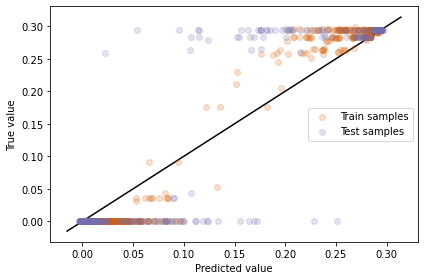

In [20]:
#Plot Predictions:
max_score = max([y_train.max(), y_test.max()])
plt.scatter(train_predictions, y_train, label="Train samples", c="#d95f02", alpha=0.2)
plt.scatter(test_predictions, y_test, label="Test samples", c="#7570b3", alpha=0.2)
plt.xlabel("Predicted value")
plt.ylabel("True value")
plt.legend()
plt.plot([-(0.05*max_score), (1.05*max_score)], [-(0.05*max_score), (1.05*max_score)], c="k", zorder=0)
plt.tight_layout()
plt.savefig('/'.join([dir_name, project, 'model_performance_cycle_%u.png' % C]),dpi=600)
plt.show()

### Create sampling distribution from predicted combinatorial space

In [21]:
### Function to Generate LHS-aided representation of population ###
def generate_representative_combinatorial_space(maximum_deletion_number, target_number):
    samples = []
    
    for de in range(1,maximum_deletion_number+1):
        print(f"Generating representation of {de} deletion designs")
        remaining_samples = de*target_number
        
        while remaining_samples > 0:
            sampler = qmc.LatinHypercube(d=de)
            pop = sampler.integers(l_bounds=0, u_bounds=target_number, n=remaining_samples)
            valid_designs = [design for design in pop
                             if len(set(design))== len(list(design)) # As each number represents a design, it does not makes sense to repeat a number in a design
                             and not any([np.array_equal(design, sample) for sample in samples])]
            
            samples += valid_designs            
            remaining_samples -= len(valid_designs)
    
    return samples

def LHS_representative_combinatorial_space(deletion_number, target_number, remaining_samples):
    samples = []

    while remaining_samples > 0:
        sampler = qmc.LatinHypercube(d=deletion_number)
        pop = sampler.integers(l_bounds=0, u_bounds=target_number, n=1)
        valid_designs = [design for design in pop
                         if len(set(design))== len(list(design)) # As each number represents a reaction, it does not makes sense to repeat a number in a design
                         and not any([np.array_equal(design, sample) for sample in samples])]

        samples += valid_designs
        remaining_samples -= len(valid_designs)

    return samples

### Function to Generate LHS-aided representation of population ###
def generate_representative_combinatorial_space_parallel(maximum_deletion_number, target_number, n_processes=32):
    samples = []
    maximum_deletion_number = min([maximum_deletion_number, target_number]) #assure that maximum deletions are not over target_number

    total_samples = [sample
                     for de in range(1,maximum_deletion_number+1)
                     for sample in [de]*(de*target_number)]
    
    task_list = [(de, target_number, total_samples.count(de))
                 for de in range(1,maximum_deletion_number+1)]

    result_list = joblib.Parallel(backend="loky",
                                  n_jobs=n_processes,
                                  batch_size=math.ceil(len(task_list)/n_processes), verbose=10)(joblib.delayed(LHS_representative_combinatorial_space)(d, t, s) for d, t, s in task_list)
    
    #Linearize result_list    
    return [design for design_set in result_list for design in design_set]


### Functions to Compute a Sampling Distribution of Reaction Targets from a representation of population ###
def integrate(x, y):
    sm = 0
    for i in range(1, len(x)):
        h = x[i] - x[i-1]
        sm += h * (y[i-1] + y[i]) / 2

    return sm

def compute_feature_frecuency(scored_designs_data, target_score, bins=20):
    features = list(set(scored_designs_data.columns)-{target_score})
    score_thresholds = np.arange(0, scored_designs_data[target_score].max(), scored_designs_data[target_score].max()/bins)
    #Generate a score dependent frequency dataset, where a  
    #probability distribution is computed for each variable 
    freq_data = {'Threshold' : []}

    for column in features:
        freq_data[column] = []

    for threshold in score_thresholds:
        freq_data['Threshold'].append(threshold)
        tmp_df = scored_designs_data.loc[scored_designs_data[target_score]>=threshold][features]

        for column in features:
            freq_data[column].append(sum(tmp_df[column].tolist())/len(tmp_df))

    return pd.DataFrame.from_dict(freq_data)

def compute_feature_AUC(target_frequency_vs_score, threshold_colname='Threshold'):
    features = list(set(target_frequency_vs_score.columns)-{threshold_colname}) 

    area_df = pd.DataFrame.from_dict({ 'AUC' : [integrate(target_frequency_vs_score[threshold_colname], target_frequency_vs_score[column])
                                                for column in features],
                                       'Feature': features
                                     })
    
    area_df.sort_values('AUC', ascending=False, inplace= True)

    return area_df

def compute_sampling_dict(scored_designs_data, target_score):
    #FIRST GENERATE THE FREQUENCY DATAFRAME
    freq_df = compute_feature_frecuency(scored_designs_data, target_score)
    #display(freq_df)
    
    #NOW GENERATE AUC DATA FOR EACH TARGET
    AUC_df = compute_feature_AUC(freq_df, threshold_colname='Threshold')
    #display(AUC_df)
    
    #FINALLY NORMALIZE AUC DATA SO THE SUM OF ALL TARGETS IS 1. IN THAT
    #WAY THE RELATIVE AUC WILL BE THE SAMPLING FREQUENCE OF EACH REACTION
    total_AUC = AUC_df['AUC'].sum()
    score_sampling_dict = {feature : AUC/total_AUC for feature, AUC in zip(AUC_df['Feature'].values, AUC_df['AUC'].values) }

    return score_sampling_dict


### Functions to generate machine learning-guided recommendations ###
def design_to_ml_readable(design, feature_ordered_list, mode):
    import warnings
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    if mode=='string':
        design_part_list = [ int(feature in design) for feature in feature_ordered_list ]
        
    elif mode=='index':
        design_part_list = [ int(feature_ordered_list.index(feature) in design) for feature in feature_ordered_list ]
        
    else:
        design_part_list=None
        print("Only 'string' and 'index' are supported values for 'mode' parameter")        
    
    return pd.DataFrame([design_part_list], columns=feature_ordered_list)

def generate_model_recommendations(ML_model, sampling_dict, feature_ordered_list, mode, max_deletions=10, score_threshold=0, suggestion_number=10):
    design_list = []
    
    while suggestion_number-len(design_list) > 0:
        design_length = np.random.randint(max_deletions+1, size=1)[0]
        designs = np.random.choice(list(sampling_dict.keys()), size=(int(suggestion_number/5), design_length), p=list(sampling_dict.values())).tolist()
        designs_ML = [design_to_ml_readable(design, feature_ordered_list, "string") for design in designs]
        designs_scores = [ML_model.predict(design)[0] for design in designs_ML]

        if mode=='explorative':
            #print(design_score)
            design_list += [ design.values.tolist()[0]+[score] for design, score in zip(designs_ML, designs_scores)]
            
        elif mode=='exploitative':
            design_list += [design.values.tolist()[0]+[score]
                            for design, score in zip(designs_ML, designs_scores)
                            if score >= score_threshold]
            
        else:
            print("Only 'explorative' and 'exploitative' are supported values for 'mode' parameter")
            
        print(f"{suggestion_number-len(design_list)} recommendations left..")

    return pd.DataFrame(design_list, columns=feature_ordered_list+['Predicted_Score'])

### Generate LHS-aided representation of population

In [22]:
%%time
#max_kos=15
reaction_ordered_list = X_train.columns.tolist()
combinatorial_space_representation_samples = generate_representative_combinatorial_space_parallel(max_kos, len(reaction_ordered_list), n_processes=6)
combinatorial_space_representation = pd.concat([design_to_ml_readable(design, reaction_ordered_list, "index") for design in combinatorial_space_representation_samples], ignore_index=True)
combinatorial_space_representation["score"] = automl.predict(combinatorial_space_representation)
combinatorial_space_representation

[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    2.1s
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:   10.8s
[Parallel(n_jobs=6)]: Done  18 tasks      | elapsed:   24.5s
[Parallel(n_jobs=6)]: Done  25 tasks      | elapsed:  1.2min
[Parallel(n_jobs=6)]: Done  27 out of  30 | elapsed:  1.5min remaining:   10.1s
[Parallel(n_jobs=6)]: Done  30 out of  30 | elapsed:  2.1min finished


CPU times: user 1min 59s, sys: 1.05 s, total: 2min
Wall time: 4min 6s


,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,PRASCSi_copy2,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,score
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.000032
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000444
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.000046
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.000056
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-0.000048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54865,1,1,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.001612
54866,0,0,0,1,0,1,0,0,0,1,...,1,0,1,0,0,0,1,0,0,0.001191
54867,0,1,0,0,0,1,0,0,0,0,...,1,0,0,1,1,0,1,0,0,0.006327
54868,1,0,1,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,1,0.001568


In [23]:
fig = px.histogram(combinatorial_space_representation, x="score", log_y=True )

fig.update_layout(template="plotly_white", title='<b>Yield Overview of Predicted Combinatorial Space</b>')

fig.show()

### Generate Sampling distribution for guiding the search of performance-optimised designs

In [24]:
%%time
yield_sampling_dict = compute_sampling_dict(combinatorial_space_representation[combinatorial_space_representation.columns], "score")
yield_sampling_dict

CPU times: user 233 ms, sys: 16.1 ms, total: 249 ms
Wall time: 247 ms


{'ICL': 0.03457731324306875,
 'SSALy': 0.03057992412574893,
 'AKGDH': 0.025941865494599235,
 'MDH': 0.014771749781799164,
 'DHQTi_copy1': 0.014210613152053969,
 'PMANM': 0.013239032684169294,
 'MALS': 0.013178455911469168,
 'ADK1': 0.012546162659970331,
 'PHETHPTOX3': 0.011879500019849908,
 'LYSRC': 0.011228960263512841,
 'GLUSy': 0.011183698736624932,
 '1PPDCRc': 0.011099065554484765,
 'SERAT_copy1': 0.010973458598370947,
 'ACS': 0.010393896367116143,
 'ME2': 0.010342792621815209,
 'GLUDxi': 0.010205663834993823,
 'ADPT': 0.01014990940057162,
 'GLYCK': 0.010069983938961972,
 'IDPh_1': 0.010066752595806621,
 'NDP8': 0.010019394157902154,
 'PRPPS': 0.0100107587804493,
 'ALAR': 0.009991446038123176,
 'ALATA_L': 0.009894060689493306,
 'GLNS_copy2': 0.009843661184588655,
 'PHETA1': 0.009831987501602336,
 'SUCOAS': 0.009708146928229801,
 'PGI': 0.009657516416113466,
 'ALATRS': 0.009529937139540354,
 'FE3DCITR': 0.009480396603884274,
 'ALDD1': 0.009413189129729917,
 'FALDM': 0.00930539302759

### Generate Sampling distribution to improve the learning of the combinatorial space

In [25]:
X_test['Output_SE'] = (y_test - test_predictions)**2 #SQUARED ERROR
X_train['Output_SE'] = (y_train - train_predictions)**2 #SQUARED ERROR
X_test['Output_AE'] = abs(y_test - test_predictions) #ABSOLUTE ERROR
X_train['Output_AE'] = abs(y_train - train_predictions) #ABSOLUTE ERROR

# get the maximum absolute error to use it later as exploring importance
error_input_df = X_train.append(X_test)
max_AE = error_input_df['Output_AE'].max()
mean_AE = error_input_df['Output_AE'].mean()
max_AE = max_AE
mean_AE = mean_AE

target_column = error_input_df['Output_AE'].values.reshape(-1, 1) #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
scaler = min_max_scaler.fit(target_column)
scaled_target_column = scaler.transform(target_column)

error_input_df['Output_AE'] = [ v[0] for v in list(scaled_target_column)]

error_input_df

,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,Output_SE,Output_AE
583,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,3.254856e-09,0.000227
130,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,4.409373e-10,0.000084
2485,0,0,0,0,0,0,0,0,1,0,...,1,0,1,0,0,0,0,0,4.009319e-10,0.000080
1003,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,1,0,2.459810e-09,0.000198
2312,0,0,0,0,1,0,0,0,1,0,...,0,0,1,0,0,0,0,0,1.975195e-09,0.000177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1007,0,0,0,1,0,1,0,0,1,0,...,1,0,1,0,0,0,0,0,4.797562e-06,0.008734
2621,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1.760020e-09,0.000167
773,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,4.661808e-09,0.000272
3699,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,7.620054e-06,0.011008


In [26]:
%%time
error_input_df.pop("Output_SE")
error_sampling_dict = compute_sampling_dict(error_input_df, "Output_AE")
error_sampling_dict

CPU times: user 215 ms, sys: 54 µs, total: 215 ms
Wall time: 214 ms


{'SSALy': 0.05572653904543773,
 'ICL': 0.050728442047520715,
 'AKGDH': 0.03869056997496108,
 'TRSARr': 0.03814892452118892,
 'G6PDH2r': 0.036936128512260386,
 'PRASCSi_copy1': 0.03087678147832139,
 'GLYALDDr': 0.030233482041494765,
 'GLNS_copy1': 0.028015276422797282,
 'DHAD1_copy1': 0.02690338191858666,
 '1PPDCRc': 0.02560256348085481,
 'GLUDy': 0.025561398234303614,
 'DHSKDH': 0.021548860234253647,
 'GLUSy': 0.021433311950567045,
 'FDH': 0.02094084563471455,
 'CBPS': 0.02088826159401475,
 'PGI': 0.020261263539542242,
 'PMANM': 0.01873570500945784,
 'SUCOAS': 0.017721159680861385,
 'HEPCT': 0.016327190726243314,
 'MALS': 0.016016223900451543,
 'PRAIi_copy1': 0.01575055613645472,
 'PHETHPTOX3': 0.015195740246210608,
 'AROH': 0.015167072674865514,
 'ALATRS': 0.014091130942674958,
 'APPAT': 0.013648093292725157,
 'DHAD1_copy2': 0.013303079540015365,
 'PRPPS': 0.013203305547799037,
 'FALDM': 0.013000531389814416,
 'HDH': 0.01289913203970949,
 'NDP8': 0.012830736828895406,
 'FE3DCITR': 0.0

#### It is interesting that the reactions giving higher flux predictions also are the ones contributing more to errors

### Find optimal designs according to model : suggest design recommendations from sampling_dict

In [27]:
%%time
# Generate final sampling dict and export it to pickle
sampling_dict = { reaction : (optimizing_importance*yield_sampling_dict[reaction]) +
                             (exploring_importance*error_sampling_dict[reaction])
                  for reaction in error_sampling_dict.keys()
                }

sampling_filepath = '/'.join([dir_name, project, 'generator_sampling_probability_%u.pkl' % C])
sampling_file = open(sampling_filepath, 'wb')
pickle.dump(sampling_dict, sampling_file)

recommendations = generate_model_recommendations(automl, sampling_dict, reaction_ordered_list, recommendation_mode,
                                                 max_deletions=30, score_threshold=optimization_threshold*max_score, suggestion_number=n_recommendations)
recommendations

100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
100 recommendations left..
99 recommendations left..
99 recommendations left..
99 recommendations left..
97 recommendations left..
97 recommendations left..
97 recommendations left..
96 recommendations left..
95 recommendations left..
95 recommendations left..
95 recommendations left..
95 recommendations left..
95 recommendations left..
95 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
94 recommendations left..
93 recommendations left..
93 recommendations left..
91 recommendations left..
88 recommendations left..
87 recommendations left..
87 recommendations left..
87 recommendations left..
86

,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,PRASCSi_copy2,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,Predicted_Score
0,0,0,0,0,0,0,0,1,0,1,...,1,0,0,0,0,0,0,0,0,0.158240
1,0,0,0,0,0,1,0,0,0,0,...,1,0,1,1,1,0,1,1,0,0.162115
2,0,0,0,0,1,0,0,0,0,1,...,0,1,0,1,0,0,0,0,0,0.155496
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.276682
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.179476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.262502
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0.259952
97,0,0,0,0,1,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0.161914
98,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0.183191


In [28]:
recommendations["Predicted_Score"].describe()

count    100.000000
mean       0.187843
std        0.033829
min        0.150513
25%        0.161144
50%        0.175702
75%        0.205535
max        0.276682
Name: Predicted_Score, dtype: float64

## Test ML ensemble model recomendations in GEM

In [29]:
model = cb.io.load_matlab_model('/'.join([dir_name, project,  'configured_model.mat']))

model.summary()

2024-11-25 10:22:34,215 - cobra.summary.model_summary - INFO - Generating new parsimonious flux distribution.


Metabolite,Reaction,Flux,C-Number,C-Flux
4hbz_e,EX_4hbz_e,5.143,7,100.00%
ca2_e,EX_ca2_e,0.001681,0,0.00%
cl_e,EX_cl_e,0.001681,0,0.00%
cobalt2_e,EX_cobalt2_e,0.001121,0,0.00%
cu2_e,EX_cu2_e,0.001121,0,0.00%
fe2_e,EX_fe2_e,0.005842,0,0.00%
h_e,EX_h_e,1.257,0,0.00%
k_e,EX_k_e,0.06305,0,0.00%
mg2_e,EX_mg2_e,0.002802,0,0.00%
mobd_e,EX_mobd_e,0.001121,0,0.00%


In [30]:
#redistribute recommendations in the column order used to save the library
column_order = input_df.columns.tolist()[:-1]
recommendations = recommendations[column_order+['Predicted_Score']]

print("Computing true values for reccomendations...")
recommendations_data_samples = recommendations[model_setup["reaction_list"]].values #avoid selecting target_var row
GEM_scorer = StrainDesignScorer(model_setup, recommendations_data_samples,  score=target_var, parallelize=True)
GEM_list = GEM_scorer.run()
recommendations[target_var] = [r[0][-1] for r in GEM_list]

print("Extracting details for best predicted design and best design according to GEM..")
column_order = recommendations.columns[:-2]
max_pred_score = recommendations["Predicted_Score"].max()
max_GEM_score = recommendations[target_var].max()
#Extract details of best predicted design
best_predicted_design = recommendations.loc[recommendations["Predicted_Score"]==max_pred_score][column_order].values
GEM_best_predicted_design = recommendations.loc[recommendations["Predicted_Score"]==max_pred_score][target_var].values
best_predicted_design = binary_to_designs(best_predicted_design, column_order)
#Extract details of best design according to GEM
best_design_in_recommendations = recommendations.loc[recommendations[target_var]==max_GEM_score][column_order].values
pred_best_design = recommendations.loc[recommendations[target_var]==max_GEM_score]["Predicted_Score"].values
best_design_in_recommendations = binary_to_designs(best_design_in_recommendations, column_order)          

Computing true values for reccomendations...
Testing all samples in the GEM...
Parallelizing task..


[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


Set parameter Username
Academic license - for non-commercial use only - expires 2025-11-20
Read LP format model from file /tmp/tmpc_blpsiy.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Set parameter Username
Academic license - for non-commercial use only - expires 2025-11-20
Read LP format model from file /tmp/tmp4fyt5c2s.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Set parameter Username
Academic license - for non-commercial use only - expires 2025-11-20
Read LP format model from file /tmp/tmpdlfvd8oh.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Set parameter Username
Academic license - for non-commercial use only - expires 2025-11-20
Read LP format model from file /tmp/tmpyheigbzi.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Set parameter Username
Academic license - for non-commercial use only - expires 2025-11-20
Read LP format model from file /tmp/tmp3gtiwyrw.lp
Reading time =

[Parallel(n_jobs=6)]: Done   4 tasks      | elapsed:    6.8s


Read LP format model from file /tmp/tmp2sgu9hie.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpw_2qmabv.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp6yqpcbk7.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpk6qlwz8_.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmppfdue9hl.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp9ggmya6u.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros


[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    9.5s


Read LP format model from file /tmp/tmpe33dtgm6.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmph2swxqv_.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpxinbbe66.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpmlalyq9g.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpa3ukhqdd.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros


[Parallel(n_jobs=6)]: Done  18 tasks      | elapsed:   12.1s


Read LP format model from file /tmp/tmpvw7ni_ra.lp
Reading time = 0.02 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpajzdnyp2.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpgnexw53k.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp6wt6n8qd.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp4p92yxp8.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp63y_mcdj.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros


[Parallel(n_jobs=6)]: Done  25 tasks      | elapsed:   15.5s


Read LP format model from file /tmp/tmpce7l0io8.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp6f98g435.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmppdqrps7z.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpii3roekm.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmphheaz31w.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmphb2o61jj.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmppoexjgm7.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmplg1y4qkn.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros


[Parallel(n_jobs=6)]: Done  32 tasks      | elapsed:   19.1s


Read LP format model from file /tmp/tmpnved2blw.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp1gbgh_ne.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpgadqaqng.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpi3fscqsk.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpkd9kvwrb.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmptgwhxkc6.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpm9wp0ily.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpevgm72b_.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpv

[Parallel(n_jobs=6)]: Done  41 tasks      | elapsed:   23.1s


Read LP format model from file /tmp/tmpgo6ltnku.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp19gt1tms.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp458774r0.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpbe_el385.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpofp90p5e.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp51i0wix8.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpq4xxj_rb.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp46adtzqn.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp9

[Parallel(n_jobs=6)]: Done  50 tasks      | elapsed:   28.7s


Read LP format model from file /tmp/tmpvwkrztdo.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpyrjcsbxb.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpnvcbxx32.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpq5cd9n8f.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpw3rnxq1u.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp15faux_8.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpvlmt98fu.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpc9f_6xta.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmph

[Parallel(n_jobs=6)]: Done  61 tasks      | elapsed:   33.2s


Read LP format model from file /tmp/tmpux6foiuo.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp59_mfxb6.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpup_lwniz.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpmeztqzvh.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpnoqoxegn.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpt7zzpa11.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpqel22_gg.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp0bn7ai_3.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp0

[Parallel(n_jobs=6)]: Done  72 tasks      | elapsed:   39.2s


Read LP format model from file /tmp/tmpqdxu1ate.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp82owr5is.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpouak3r9l.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpuua9e7tp.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp5q1uq7h0.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp57v1f6nr.lp
Reading time = 0.02 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpahm0z1pz.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpg_0fkiyt.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp7

[Parallel(n_jobs=6)]: Done  85 tasks      | elapsed:   46.0s


Read LP format model from file /tmp/tmp8lzmu5yh.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp_iahozxn.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpzienbg1b.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmpm7zxvsbj.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp9s5i7mzd.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp9sc7e4sv.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp2_alera5.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp8lznhuhz.lp
Reading time = 0.01 seconds
: 2157 rows, 1830 columns, 7086 nonzeros
Read LP format model from file /tmp/tmp_

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed:   52.7s finished


In [31]:
target_biomass = 'BIOMASS_KT2440_Core2'

display_KO_candidates_results(model,
                              [sd.split('-') for sd in best_design_in_recommendations],
                              target_biomass,
                              target_reaction)

#print('ML best predicted design is %s, which has a BCPY of %f' % (top_design, bcpy_ML))
#print('Library best BCPY design is %s, which has a BCPY of %f' % (library_design, bcpy_library))

2024-11-25 10:23:27,074 - cobra.medium.boundary_types - INFO - Compartment `e` sounds like an external compartment. Using this one without counting boundary reactions.


Results for deletion of LSERDHr, DHQTi_copy1, LTDCL, GAPD, SSALy, RBK, PPA, AROH, FE3DCITR, AKGDH, TALA, ICL, HDH, SERAT_copy2, ADK1, NTD4, PHETHPTOX3, NDPK5, APPAT, PRASCSi_copy2
Flux of biomass solution is 0.14976262470538973 and the flux of target reaction is 1.9679596633309846


Reaction identifier,LSERDHr
Name,L-serine dehydrogenase
Memory address,0x07fa3841d6a60
Stoichiometry,nadp_c + ser__L_c --> 2amsa_c + h_c + nadph_c Nicotinamide adenine dinucleotide phosphate + L-Serine --> 2-Aminomalonate semialdehyde + H+ + Nicotinamide adenine dinucleotide phosphate - reduced
GPR,PP_4862
Lower bound,0
Upper bound,0


Reaction identifier,DHQTi_copy1
Name,"3-dehydroquinate dehydratase, irreversible"
Memory address,0x07fa3841fbcd0
Stoichiometry,3dhq_c --> 3dhsk_c + h2o_c 3-Dehydroquinate --> 3-Dehydroshikimate + H2O H2O
GPR,PP_0560 or PP_3003 or PP_2407
Lower bound,0
Upper bound,0


Reaction identifier,LTDCL
Name,L-Tryptophan decarboxy-lyase
Memory address,0x07fa3841d6b50
Stoichiometry,h_c + trp__L_c --> co2_c + trypta_c H+ + L-Tryptophan --> CO2 CO2 + Tryptamine cytosol
GPR,PP_2552
Lower bound,0
Upper bound,0


Reaction identifier,GAPD
Name,Glyceraldehyde-3-phosphate dehydrogenase
Memory address,0x07fa3841af370
Stoichiometry,g3p_c + nad_c + pi_c --> 13dpg_c + h_c + nadh_c Glyceraldehyde 3-phosphate + Nicotinamide adenine dinucleotide + Phosphate --> 3-Phospho-D-glyceroyl phosphate + H+ + Nicotinamide adenine dinucleotide - reduced
GPR,PP_1009 or PP_2149
Lower bound,0
Upper bound,0


Reaction identifier,SSALy
Name,Succinate-semialdehyde dehydrogenase (NADP)
Memory address,0x07fa3841adb20
Stoichiometry,h2o_c + nadp_c + sucsal_c --> 2.0 h_c + nadph_c + succ_c H2O H2O + Nicotinamide adenine dinucleotide phosphate + Succinic semialdehyde --> 2.0 H+ + Nicotinamide adenine dinucleotide phosphate - reduced + Succinate
GPR,PP_0213 or PP_2488 or PP_3151 or PP_4422
Lower bound,0
Upper bound,0


Reaction identifier,RBK
Name,Ribokinase
Memory address,0x07fa38419fcd0
Stoichiometry,atp_c + rib__D_c --> adp_c + h_c + r5p_c ATP C10H12N5O13P3 + D-Ribose --> ADP C10H12N5O10P2 + H+ + Alpha-D-Ribose 5-phosphate
GPR,PP_2458
Lower bound,0
Upper bound,0


Reaction identifier,PPA
Name,Inorganic diphosphatase
Memory address,0x07fa384191820
Stoichiometry,h2o_c + ppi_c --> h_c + 2.0 pi_c H2O H2O + Diphosphate --> H+ + 2.0 Phosphate
GPR,PP_0538 or PP_1620 or PP_5216
Lower bound,0
Upper bound,0


Reaction identifier,AROH
Name,L-Arogenate hydro-lyase
Memory address,0x07fa38426daf0
Stoichiometry,Largn_c --> co2_c + h2o_c + phe__L_c L-Arogenate --> CO2 CO2 + H2O H2O + L-Phenylalanine
GPR,PP_1769
Lower bound,0
Upper bound,0


Reaction identifier,FE3DCITR
Name,Ferric dicitrate reductase frxr 42
Memory address,0x07fa384214d60
Stoichiometry,fdxr_42_c + 2.0 fe3dcit_c --> 4.0 cit_c + fdxo_42_c + 2.0 fe2_c Ferredoxin (reduced form 4:2) + 2.0 Fe(III)dicitrate --> 4.0 Citrate + Ferredoxin (oxidized form 4:2) + 2.0 Fe2+ mitochondria
GPR,PP_1638
Lower bound,0
Upper bound,0


Reaction identifier,AKGDH
Name,2-Oxogluterate dehydrogenase
Memory address,0x07fa384168e80
Stoichiometry,akg_c + coa_c + nad_c --> co2_c + nadh_c + succoa_c 2-Oxoglutarate + Coenzyme A + Nicotinamide adenine dinucleotide --> CO2 CO2 + Nicotinamide adenine dinucleotide - reduced + Succinyl-CoA
GPR,PP_4189 and PP_4188 and PP_4187
Lower bound,0
Upper bound,0


Reaction identifier,TALA
Name,Transaldolase
Memory address,0x07fa38413d190
Stoichiometry,g3p_c + s7p_c --> e4p_c + f6p_c Glyceraldehyde 3-phosphate + Sedoheptulose 7-phosphate --> D-Erythrose 4-phosphate + D-Fructose 6-phosphate
GPR,PP_2168
Lower bound,0
Upper bound,0


Reaction identifier,ICL
Name,Isocitrate lyase
Memory address,0x07fa3841c9a60
Stoichiometry,icit_c --> glx_c + succ_c Isocitrate --> Glyoxylate + Succinate
GPR,PP_4116
Lower bound,0
Upper bound,0


Reaction identifier,HDH
Name,"Histidinol dehydrogenase, cytosol"
Memory address,0x07fa3841584c0
Stoichiometry,h2o_c + histd_c + 2.0 nad_c --> 4.0 h_c + his__L_c + 2.0 nadh_c H2O H2O + L-Histidinol + 2.0 Nicotinamide adenine dinucleotide --> 4.0 H+ + L-Histidine + 2.0 Nicotinamide adenine dinucleotide - reduced
GPR,PP_0966
Lower bound,0
Upper bound,0


Reaction identifier,SERAT_copy2
Name,Serine O-acetyltransferase
Memory address,0x07fa384158670
Stoichiometry,accoa_c + ser__L_c --> acser_c + coa_c Acetyl-CoA + L-Serine --> O-Acetyl-L-serine + Coenzyme A
GPR,PP_0228 or PP_0840 or PP_1110 or PP_3136
Lower bound,0
Upper bound,0


Reaction identifier,ADK1
Name,Adenylate kinase
Memory address,0x07fa384168580
Stoichiometry,amp_c + atp_c --> 2.0 adp_c AMP C10H12N5O7P + ATP C10H12N5O13P3 --> 2.0 ADP C10H12N5O10P2
GPR,PP_1506
Lower bound,0
Upper bound,0


Reaction identifier,NTD4
Name,5'-nucleotidase (CMP)
Memory address,0x07fa384174160
Stoichiometry,cmp_c + h2o_c --> cytd_c + pi_c CMP C9H12N3O8P + H2O H2O --> Cytidine + Phosphate
GPR,PP_1620
Lower bound,0
Upper bound,0


Reaction identifier,PHETHPTOX3
Name,L Phenylalanine tetrahydrobiopterinoxygen oxidoreductase Tetrahydromonapterin
Memory address,0x07fa3841912b0
Stoichiometry,o2_c + phe__L_c + thmnp_c --> dhmpt_c + h2o_c + tyr__L_c O2 O2 + L-Phenylalanine + Tetrahydromonapterin --> Dihydromonapterin + H2O H2O + L-Tyrosine
GPR,PP_4490 and PP_4491
Lower bound,0
Upper bound,0


Reaction identifier,NDPK5
Name,Nucleoside-diphosphate kinase (ATP:dGDP)
Memory address,0x07fa3841748e0
Stoichiometry,atp_c + dgdp_c --> adp_c + dgtp_c ATP C10H12N5O13P3 + DGDP C10H12N5O10P2 --> ADP C10H12N5O10P2 + DGTP C10H12N5O13P3
GPR,PP_0849 or PP_1506
Lower bound,0
Upper bound,0


Reaction identifier,APPAT
Name,ATP:pantetheine-4'-phosphate adenylyltransferase
Memory address,0x07fa384158520
Stoichiometry,atp_c + 2.0 h_c + pan4p_c --> dpcoa_c + ppi_c ATP C10H12N5O13P3 + 2.0 H+ + Pantetheine 4'-phosphate --> Dephospho-CoA + Diphosphate
GPR,PP_5123
Lower bound,0
Upper bound,0


Reaction identifier,PRASCSi_copy2
Name,Phosphoribosylaminoimidazolesuccinocarboxamide synthase
Memory address,0x07fa384158490
Stoichiometry,5aizc_c + asp__L_c + atp_c --> 25aics_c + adp_c + h_c + pi_c 5-amino-1-(5-phospho-D-ribosyl)imidazole-4-carboxylate + L-Aspartate + ATP C10H12N5O13P3 --> (S)-2-[5-Amino-1-(5-phospho-D-ribosyl)imidazole-4-carboxamido]succinate + ADP C10H12N5O10P2 + H+ +...
GPR,PP_1240
Lower bound,0
Upper bound,0


### Save recommendations in a file for next cycle

In [32]:
recommendations.to_csv('/'.join([dir_name, project, f'cycle_{C}_recommendations.csv']), index=False)

In [33]:
end = time.time()
print('Cycle execution time : ', (end-start)/60)

Cycle execution time :  24.046508165200553


## Overall DBTL performance

In [34]:
display(recommendations)
print(f"Best recommendation design predicted score : {max_pred_score}")
print("Designs :")
for design, design_score in zip(best_predicted_design, GEM_best_predicted_design):
    print(f"{design} -> GEM validation score : {design_score}")

print("")
    
print(f"Best GEM validation score among design recomendations : {max_GEM_score}")
print("Designs :")
for design, design_score in zip(best_design_in_recommendations, pred_best_design):
    print(f"{design} -> Predicted score : {design_score}")     

,PTRCTA2,DMALRED,G3PD2,DLYSPYRAT,DHSKDH,VALDHr,MEPCT,LSERDHr,G6PDH2r,DHQTi_copy1,...,CBPS,FRDO7r,TRSARr,G5SD_copy1,GLNS_copy2,FRDO6r,MDH,PPM,Predicted_Score,bcpy
0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0.158240,0.294727
1,0,0,0,0,0,1,0,0,0,0,...,0,1,1,1,0,1,1,0,0.162115,0.263535
2,0,0,0,0,1,0,0,0,0,1,...,1,0,1,0,0,0,0,0,0.155496,0.000000
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.276682,0.283153
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.179476,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.262502,0.000000
96,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0.259952,0.283153
97,0,0,0,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0.161914,0.000000
98,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0.183191,0.000000


Best recommendation design predicted score : 0.27668220177292824
Designs :
SSALy-GLYCTO1-AKGDH-IDPh_1-ICL-FE3DCITCH -> GEM validation score : 0.28315331863729215

Best GEM validation score among design recomendations : 0.2947268044947764
Designs :
LSERDHr-DHQTi_copy1-LTDCL-GAPD-SSALy-RBK-PPA-AROH-FE3DCITR-AKGDH-TALA-ICL-HDH-SERAT_copy2-ADK1-NTD4-PHETHPTOX3-NDPK5-APPAT-PRASCSi_copy2 -> Predicted score : 0.15824011573567986


In [35]:
performance_filepath = '/'.join([dir_name, project, 'DBTL_performance.csv'])

best_design_in_recommendations_min_length = min([len(d.split("-")) for d in best_design_in_recommendations])

performance_data = { 'Cycle' : [C],
                     'R2_train' : [r2_tr],
                     'R2_test' :  [r2_te],
                     'MAE' : [mean_AE],
                     'max(AE)' : [max_AE],
                     'learn_weight' : [exploring_importance],
                     'optimization_weigth' : [optimizing_importance],
                     'Suggested_Designs' : [n_recommendations],
                     'Best_Predicted_Design' : [[d for d in best_design_in_recommendations
                                                 if len(d.split("-"))==best_design_in_recommendations_min_length][0]], #favour the selection of minimum KOs design
                     target_var : [max_GEM_score],
                     'Score_Improvement' : [max_GEM_score-input_df[target_var].max()],
                     'Time (min)' : [(end-start)/60]}

if C==1:
    performance_df = pd.DataFrame.from_dict(performance_data)

else:
    performance_df = pd.read_csv(performance_filepath)
    performance_df = performance_df.append(pd.DataFrame.from_dict(performance_data))
    
performance_df.to_csv(performance_filepath, index=False)
pd.set_option('display.max_colwidth', None)
performance_df

,Cycle,R2_train,R2_test,MAE,max(AE),learn_weight,optimization_weigth,Suggested_Designs,Best_Predicted_Design,bcpy,Score_Improvement,Time (min)
0,1,0.988083,0.889526,0.005853,0.293525,1,0,1200,DHSKDH-GLUDy-SSALy-FRDO4r-GLNS_copy1-FDH-DHAD1_copy2-GLUSy-AKGDH-ICL-1PPDCRc-GAPDi_nadp-PMANM-PHETHPTOX3-MALS-APPAT-TRSARr,0.299045,0.004878,10.767578
1,2,0.984676,0.909980,0.004089,0.246952,1,0,2400,G6PDH2r-SSALy-SERAT_copy1-SUCOAS-FDH-FALDM-AGMDA-NDP8-ICL-HDH-ALDD1-1PPDCRc-PPNDH-PRPPS-PRAIi_copy1-DHAD1_copy1-CBPS,0.295559,-0.003486,13.987383
2,3,0.982014,0.907101,0.003666,0.266265,0,1,100,SSALy-SUCOAS-GLNS_copy1-FDH-PRASCSi_copy1-TALA-ICL-FE3PYOVDL-ILETA-OXOADLR-GLUDxi,0.296097,-0.002948,22.868034
0,4,0.981085,0.848079,0.005287,0.250775,0,1,100,LSERDHr-DHQTi_copy1-LTDCL-GAPD-SSALy-RBK-PPA-AROH-FE3DCITR-AKGDH-TALA-ICL-HDH-SERAT_copy2-ADK1-NTD4-PHETHPTOX3-NDPK5-APPAT-PRASCSi_copy2,0.294727,-0.004318,24.046508


## True vs Predicted for recomendations

In [36]:
#Plot Predictions:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_train, y=train_predictions,
                         mode="markers", marker=dict(color="grey", opacity=0.25), name="train"))

fig.add_trace(go.Scatter(x=recommendations[target_var], y=recommendations["Predicted_Score"],
                         mode="markers", marker=dict(color="purple", opacity=0.25), name="recommendations"))

max_score = max([recommendations['Predicted_Score'].max(), recommendations[target_var].max(), max_score])

fig.add_shape(
    type='line', line=dict(color="black", dash='dash'),
    x0=0, x1=max_score, y0=0, y1=max_score
)

fig.update_layout(width=500, height=500,
                  template="plotly_white",
                  legend=dict(yanchor="top", y=0.975, xanchor="right", x=0.5))

fig.update_xaxes(title="GEM Observations", zeroline=False, showline=True, mirror=True, showgrid=False, linewidth=2, linecolor='black')
fig.update_yaxes(title="Cross-Validated Predictions", zeroline=False, showline=True, mirror=True, showgrid=False, linewidth=2, linecolor='black')

fig.show()
fig.write_image("/".join([dir_name, project, f"DBTL_learning_process_{C}.svg"]))

In [37]:
gcswarms_design = "DHQTi_copy2-SSALy-HEPCT-FRDO4r-FDH-PRASCSi_copy1-GLYALDDr-AKGDH-PGI-ICL-PSCVT_copy1-1PPDCRc-ME2-TRSARr-GLNS_copy2"

## Model predictive performance: watch and see if it can be reformulated with the new approach

In [ ]:
#compute true GEM values for representative combinatorial space
LHS_data_samples = combinatorial_space_representation[model_setup["reaction_list"]].values #avoid selecting target_var row
GEM_scorer = StrainDesignScorer(model_setup, LHS_data_samples,  score=target_var, parallelize=True)
GEM_list = GEM_scorer.run()
combinatorial_space_representation["gem_value"] = [r[0][-1] for r in GEM_list]
combinatorial_space_representation

In [ ]:
x0 = combinatorial_space_representation["score"].values
x1 = combinatorial_space_representation["gem_value"].values

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0,name='predicted_score'))
fig.add_trace(go.Histogram(x=x1,name='gem_score', marker_color='lime'))
fig.update_yaxes(type="log")

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()
fig.write_image("/".join([dir_name, project, f"Combinatorial_space_prediction_{C}.svg"]))

In [ ]:
top_to_test = range(100, 1001, 100)
top_data = {'Top_N' : [], 'Cycle': [], 'Intersection': []}    

for t in top_to_test:
    true_design_rank = set([ '-'.join([str(int(r)) for r in d[:len(reaction_list)]]) 
                             for d in combinatorial_space_representation.sort_values(by="gem_value", ascending=False)[:t].values.tolist()])

    predicted_design_rank = set([ '-'.join([str(int(r)) for r in d[:len(reaction_list)]]) 
                                  for d in combinatorial_space_representation.sort_values(by="score", ascending=False)[:t].values.tolist()])
        
    top_data['Top_N'].append(t)
    top_data['Cycle'].append(C)
    top_data['Intersection'].append(len(true_design_rank.intersection(predicted_design_rank)))
    
if C>=2:
    top_df = pd.concat([pd.read_csv("/".join([dir_name, project, "model_predictive_performance.csv"])),
                        pd.DataFrame.from_dict(top_data)], ignore_index=True)
    
else:
    top_df = pd.DataFrame.from_dict(top_data)
    
top_df.to_csv("/".join([dir_name, project,"model_predictive_performance.csv"]), index=False)

fig = px.line(top_df,
              x='Cycle',
              y='Intersection',
              color='Top_N',
              markers=True)

fig.update_traces(textposition="bottom right")
fig.update_yaxes(title='Top &#8745; Top predicted', linecolor='black')
fig.update_xaxes(title='Cycle number', linecolor='black')
fig.update_layout(plot_bgcolor='white')

fig.show()

fig.write_image("/".join([dir_name, project,"model_predictive_performance.svg"]))